# <center><font color='red'>**COMPUTER VISIONS PROJECT** </font></center>





## **Part-1**

In [ ]:
# This library is used for extracting the paths of all the images
import glob
# Open CV library is used for reading the images, storing them as an array and manipulating the images
import cv2
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import plot_confusion_matrix, classification_report

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Dropout, Input, BatchNormalization, Flatten, InputLayer
from tensorflow.keras import optimizers, initializers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

In [ ]:
# from google.colab import drive
# drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
# Path of the folders where images of all the species of plants are stored
path = "/content/drive/MyDrive/AIML/GL Projects/CNN/Part-1 - Plant Seedling Classification Data/train/*/*"

In [ ]:
images = glob.glob(path) # Created a list of paths of the images

In [ ]:
# Total number of images
len(images)

4767

In [ ]:
# Let's read one image and see how it looks like in an array format. 
i1 = cv2.imread(images[1])
i1

array([[[ 51,  84, 108],
        [ 56,  89, 112],
        [ 54,  88, 110],
        ...,
        [ 23,  40,  66],
        [ 22,  37,  63],
        [ 20,  34,  60]],

       [[ 43,  77, 101],
        [ 43,  77, 102],
        [ 45,  79, 104],
        ...,
        [ 26,  42,  68],
        [ 23,  38,  64],
        [ 15,  30,  56]],

       [[ 33,  68,  94],
        [ 38,  70,  97],
        [ 38,  71,  98],
        ...,
        [ 33,  47,  73],
        [ 24,  38,  65],
        [ 12,  28,  56]],

       ...,

       [[ 58,  67,  82],
        [ 50,  59,  75],
        [ 54,  64,  79],
        ...,
        [ 58,  72,  88],
        [ 61,  74,  91],
        [ 63,  74,  91]],

       [[ 56,  65,  79],
        [ 52,  60,  76],
        [ 51,  59,  75],
        ...,
        [ 65,  79,  94],
        [ 64,  77,  93],
        [ 65,  76,  93]],

       [[ 50,  59,  74],
        [ 52,  61,  76],
        [ 51,  59,  76],
        ...,
        [ 69,  82,  96],
        [ 64,  77,  92],
        [ 72,  83,  98]]

Shape of the image is:  (117, 117, 3)


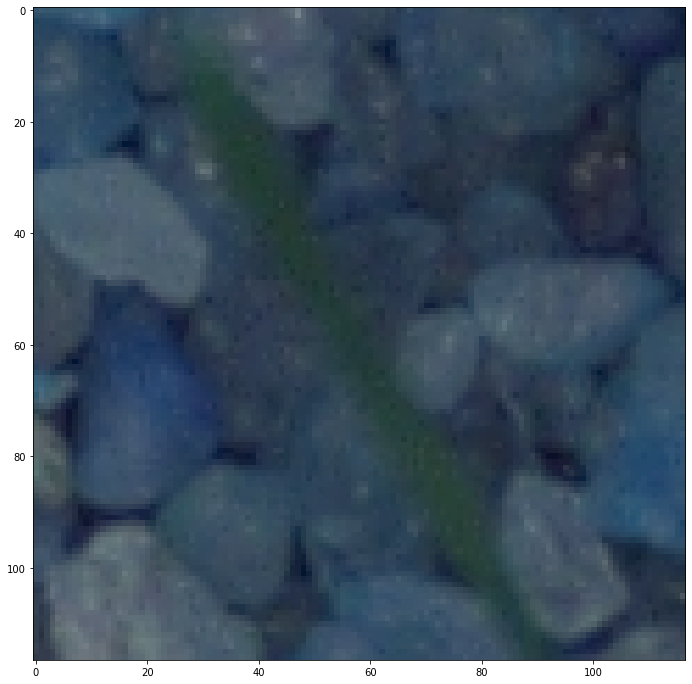

In [ ]:
# Let's visualize the image which we stored in the array
plt.figure(figsize=[12.,12.])
plt.imshow(i1)
print("Shape of the image is: ",i1.shape)

(1899, 1900, 3)


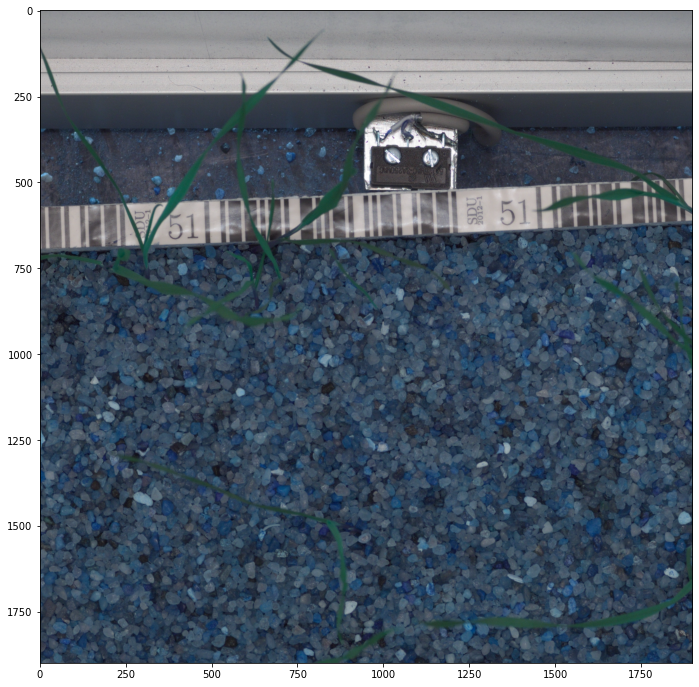

In [ ]:
# Let's visualize another image
plt.figure(figsize=[12.,12.])
plt.imshow(cv2.imread(images[5]))
# Let's also have a look at the dimension of the image
print(cv2.imread(images[5]).shape)

Seems like images have different shapes and dimensions. So, let's standardize the shape and dimensions of all the images to (64,64).

In [ ]:
# Creating data generator for training data with data augmentation and normalizing all
# values by 255
data = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   vertical_flip=True, rotation_range=90,
                                validation_split=0.2)

# Setting the target size to resize all the images to (64,64)

dataset = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Part-1 - Plant Seedling Classification Data/train",
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 4767 images belonging to 12 classes.


In [ ]:
# We have standardized the shape and dimensions of the images.
dataset.image_shape

(64, 64, 3)

Now, let's jump to model building exrcise. Let's start with supervised learning model.

In [ ]:
# Let's save all the images and their corresponding labels in separate lists and then we will convert
# them to numpy arrays.

images = []
labels = []

for i in range(len(dataset.classes)):
  # Reading the images
  image = cv2.imread(dataset.directory + '/' + dataset.filenames[i])
  # Resizing the images
  image = cv2.resize(image, (64,64))
  # Converting images to grayscale
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  # Flattening the images
  image = image.flatten()
  label = dataset.classes[i]
  # Normalizing the images
  image = image * (1./255)

  images.append(image)
  labels.append(label)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(np.array(images), np.array(labels), test_size=0.2, random_state=108)

In [ ]:
rf_model = RandomForestClassifier(max_depth=11, random_state=108)

In [ ]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=11, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=108,
                       verbose=0, warm_start=False)

I had tried several models but Random FOrest model was performing the best among those. Hence, kept this one for the reference for all the supervised learning models.

In [ ]:
rf_pred = rf_model.predict(X_test)

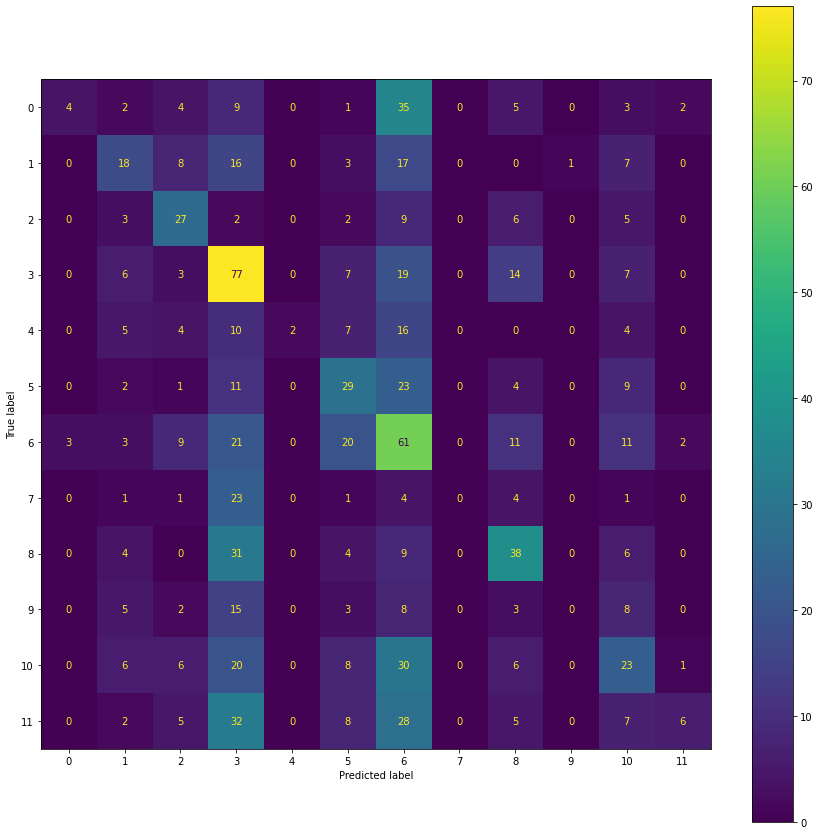

In [ ]:
fig,ax = plt.subplots(figsize=[15.,15.])
plot_confusion_matrix(rf_model, X_test, y_test, ax=ax)

In [ ]:
print(classification_report(y_test, rf_pred))

              precision    recall  f1-score   support

           0       0.57      0.06      0.11        65
           1       0.32      0.26      0.28        70
           2       0.39      0.50      0.44        54
           3       0.29      0.58      0.38       133
           4       1.00      0.04      0.08        48
           5       0.31      0.37      0.34        79
           6       0.24      0.43      0.30       141
           7       0.00      0.00      0.00        35
           8       0.40      0.41      0.40        92
           9       0.00      0.00      0.00        44
          10       0.25      0.23      0.24       100
          11       0.55      0.06      0.12        93

    accuracy                           0.30       954
   macro avg       0.36      0.25      0.22       954
weighted avg       0.35      0.30      0.26       954



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


As we can see that simple supervised learning is quite poor in image classification tasks. f1-scores for all the classes is quite low and overall accuracy is abysmal. 

Now, let's build a Neural Network Classifier

In [ ]:
# Let's define the architecture of our network
model = Sequential()
# Let's first flatten our images
model.add(Flatten())
model.add(InputLayer(input_shape=(64*64*3,)))
model.add(Dense(750))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(500))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(350))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(12,activation='softmax'))

In [ ]:
# Declare the optimizer and compile the network
opt = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
# Let's get our training and test data separately
training_data = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Part-1 - Plant Seedling Classification Data/train",
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'categorical', subset='training')
test_data = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Part-1 - Plant Seedling Classification Data/train",
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'categorical', subset='validation')

Found 3816 images belonging to 12 classes.
Found 951 images belonging to 12 classes.


In [ ]:
# Let's fit the model
model.fit(training_data,validation_data=test_data,batch_size=32,epochs=50)

Epoch 1/50
120/120 [==============================] - 2612s 22s/step - loss: 2.4476 - accuracy: 0.2188 - val_loss: 6.8388 - val_accuracy: 0.0831
Epoch 2/50
120/120 [==============================] - 70s 588ms/step - loss: 1.9115 - accuracy: 0.3367 - val_loss: 3.8234 - val_accuracy: 0.0904
Epoch 3/50
120/120 [==============================] - 71s 594ms/step - loss: 1.6844 - accuracy: 0.4033 - val_loss: 2.1311 - val_accuracy: 0.2986
Epoch 4/50
120/120 [==============================] - 70s 586ms/step - loss: 1.5712 - accuracy: 0.4363 - val_loss: 2.0916 - val_accuracy: 0.3123
Epoch 5/50
120/120 [==============================] - 70s 583ms/step - loss: 1.5111 - accuracy: 0.4617 - val_loss: 2.2478 - val_accuracy: 0.3070
Epoch 6/50
120/120 [==============================] - 70s 585ms/step - loss: 1.4591 - accuracy: 0.4887 - val_loss: 1.7329 - val_accuracy: 0.4154
Epoch 7/50
120/120 [==============================] - 70s 585ms/step - loss: 1.4291 - accuracy: 0.4906 - val_loss: 1.9363 - val_ac

Now, let's build Convolutional Neural Network

In [ ]:
# Initialising the CNN classifier
classifier = Sequential()

# Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), input_shape = (64, 64, 3), activation = 'relu', padding = 'same'))

# Add a Max Pooling layer of size 2X2
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Flattening the layer before fully connected layers
classifier.add(Flatten())

# Adding a fully connected layer with 512 neurons
classifier.add(Dense(units = 512, activation = 'relu'))

# Adding dropout with probability 0.5
classifier.add(Dropout(0.2))

# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 128, activation = 'relu'))

# The final output layer with 5 neuron to predict the categorical classifcation
classifier.add(Dense(units = 12, activation = 'softmax'))

In [ ]:
classifier.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0

In [ ]:
opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
classifier.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
classifier.fit(training_data,validation_data= test_data,batch_size=32,epochs = 50)

Epoch 1/50
149/149 [==============================] - 77s 418ms/step - loss: 2.2105 - accuracy: 0.2349
Epoch 2/50
149/149 [==============================] - 62s 416ms/step - loss: 1.5248 - accuracy: 0.4529
Epoch 3/50
149/149 [==============================] - 63s 420ms/step - loss: 1.2170 - accuracy: 0.5691
Epoch 4/50
149/149 [==============================] - 62s 411ms/step - loss: 1.0416 - accuracy: 0.6325
Epoch 5/50
149/149 [==============================] - 62s 415ms/step - loss: 0.9196 - accuracy: 0.6843
Epoch 6/50
149/149 [==============================] - 62s 415ms/step - loss: 0.8397 - accuracy: 0.7105
Epoch 7/50
149/149 [==============================] - 62s 411ms/step - loss: 0.7671 - accuracy: 0.7378
Epoch 8/50
149/149 [==============================] - 64s 426ms/step - loss: 0.7058 - accuracy: 0.7606
Epoch 9/50
149/149 [==============================] - 62s 412ms/step - loss: 0.6402 - accuracy: 0.7802
Epoch 10/50
149/149 [==============================] - 62s 414ms/step - l

It is quite clear that Convolutional Neural Network outperformed supervised learning method and Artificial Neural Network. So, let's save this model and predict on our prediction image.

It was actually obvious that CNN performs the best on the image data, because CNN has the spatial sense, which is critical to the image data. Supervised learning models and Artifitial Neural Networks don't have spatial sense and hence, they connect every pixel with one another, which is waste of computation time and resources. 

Supervised learning models are quite poor in extractng or learning features of an image. It's accuracy is abysmally low. I have used random forest model which is an emsemble method. Out of other methods, this was performing the best but still not enough.

ANNs are also not capable of handling image data and it is apparent in the performance which is quite low in comparison to CNNs. 

In [ ]:
classifier.save('./classifier.h5')

classifier.save_weights('./classifier_weights.h5')

In [ ]:
!ls

classifier.h5  classifier_weights.h5  drive  sample_data


In [ ]:
# Load the pre trained model from the HDF5 file saved previously
pretrained_model = load_model('./classifier.h5')
pretrained_model.load_weights('./classifier_weights.h5')

In [ ]:
# Let's import and read the prediction image
test_image = cv2.imread('/content/drive/MyDrive/AIML/GL Projects/CNN/Part-1 - Plant Seedling Classification Data/Seedling - Prediction/Predict.png')
plt.figure(figsize=[15.,15.])
plt.imshow(test_image)
print("Shape of the test iamge is: ",test_image.shape)

In [ ]:
# Resize the image to 64X64 shape to be compatible with the model
test_image = cv2.resize(test_image,(64,64))

# Check if the size of the Image array is compatible with Keras model
print(test_image.shape)

# If not compatible expand the dimensions to match with the Keras Input
test_image = np.expand_dims(test_image, axis = 0)
test_image = test_image*1/255.0

#Check the size of the Image array again
print('After expand_dims: '+ str(test_image.shape))

#Predict the result of the test image
result = classifier.predict(test_image)

# Check the indices Image Data Generator has allotted to each folder
classes_dict = training_set.class_indices
print(classes_dict)

# Creating a list of classes in test set for showing the result as the folder name
prediction_class = []
for class_name,index in classes_dict.items():
  prediction_class.append(class_name)
  
print(result[0])

# Index of the class with maximum probability
predicted_index = np.argmax(result[0])

# Print the name of the class
print("\n The predicted class of the test image is: ",prediction_class[predicted_index])

(64, 64, 3)
After expand_dims: (1, 64, 64, 3)
{'Black-grass': 0, 'Charlock': 1, 'Cleavers': 2, 'Common Chickweed': 3, 'Common wheat': 4, 'Fat Hen': 5, 'Loose Silky-bent': 6, 'Maize': 7, 'Scentless Mayweed': 8, 'Shepherds Purse': 9, 'Small-flowered Cranesbill': 10, 'Sugar beet': 11}
[7.7416128e-14 9.1424972e-01 8.5736834e-02 1.7906299e-10 1.2262588e-07
 3.0203330e-06 9.2849880e-15 1.5767653e-11 9.9245917e-06 1.4196559e-10
 3.1817137e-07 2.9767286e-09]

 The predicted class of the test image is:  Charlock


## **Part-2**

Explain in depth why CNN out performs neural networks which in turn out perform supervised learning models when it comes to image classification.

Let's first see why CNN is better than ANN.

The reason why Convolutional Neural Networks (CNNs) do so much better than classic neural networks on images and videos is that the convolutional layers take advantage of inherent properties of images.

* Simple feedforward neural networks don’t see any order in their inputs. If you shuffled all your images in the same way, the neural network would have the very same performance it had when trained on not shuffled images.
* CNN, in opposition, take advantage of local spatial coherence of images. This means that they are able to reduce dramatically the number of operation needed to process an image by using convolution on patches of adjacent pixels, because adjacent pixels together are meaningful. We also call that local connectivity. Each map is then filled with the result of the convolution of a small patch of pixels, slid with a window over the whole image.
* There are also the pooling layers, which downscale the image. This is possible because we retain throughout the network, features that are organized spatially like an image, and thus downscaling them makes sense as reducing the size of the image. On classic inputs such as in ANN, you cannot downscale a vector, as there is no coherence between an input and the one next to it.

* Plus, the most important point which makes CNN unique in terms of image classification which neither ANN nor Supervised Learning has is translational invariance. 

To understand the meaning of translational invariance, let's us find out what are the challenges that we face in image classification:

1- **Viewpoint variation**: Object orientation with respect to a camera.<br>
2- **Scale variation**: The Same class can exhibit variation in size.<br>
3- **Deformation**: The nature of the object that it can’t be rigid all the time.<br>
4- **Occlusion**: Sometimes only a small portion of an object could be visible.<br>
5- **Illumination conditions**: Drastic effect of the illumination on the pixel level.<br>
6- **Background clutter**: The object of interest to be mixed with its environment<br>
7- **Intra-class variation**: Broad types of the same class.

CNN handles these problems since it is invariant to the scale, deformations, orientation, illumination, since it uses filters to extract the features from an image using local spatial coherence. The features extracted by these filters aren't dependent on the position, orientation, or the scale. 
Whereas, ANN and Supervised machine learning models treat each and every pixel equally and try to find its relation with every other pixel in the image, which gives rise to redundant and expensive computations with much lower performance levels.   

Now, let's see why ANN performs better than Supervised Learning methods:

* Normal supervised machine learning models don't perform well on image data since there is no way for them to learn features of the images. They mainly take the input directly and make predictions. Hence, not only the orientation, illumination, occulation, scale, etc of an image plays a vital role in this and it is not able to distinguish between them since they treat every pixel equally w.r.t. other pixels in the image. 

* Whereas, Artifitial Neural Networks have the advantage of having multiple layers of neurons which help the network learn features of the images before making any kind of prediction and have the capability to learn by itself by calculating the loss between the predictions and the ground truth, thereby, adjusting the weights of the layers to minimize that loss through back propagation method. 

* One more advantage of Neural Network is that, while machine learning methods have certain kind of biases in them due to a specific algorithm these methods follow, Neural Networks have no such biases. They can take shape of a really complex decision boundary as per the input data and can be used to fit on any kind of data set. But ofcourse, their ability is take a hit where spatial correlation is more important than the correlation of the entire data set, like image datasets. That's where CNN shines bright. 


## **Part-3**

In [ ]:
path = "/content/drive/MyDrive/AIML/GL Projects/CNN/Cars Images/*"

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
import glob
images = glob.glob(path)

Its label is:  00011


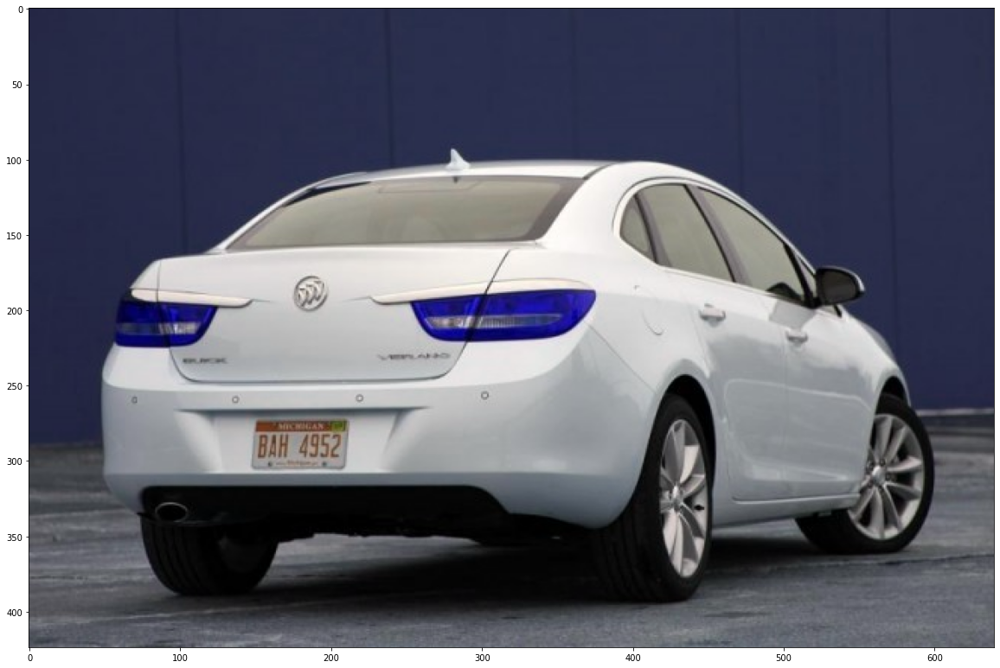

In [ ]:
import cv2
import matplotlib.pyplot as plt
plt.figure(figsize=[20.,20.])
plt.imshow(cv2.imread(images[0]))
print("Its label is: ",images[0].split('/')[-1].split('.')[0])

Its label is:  00014


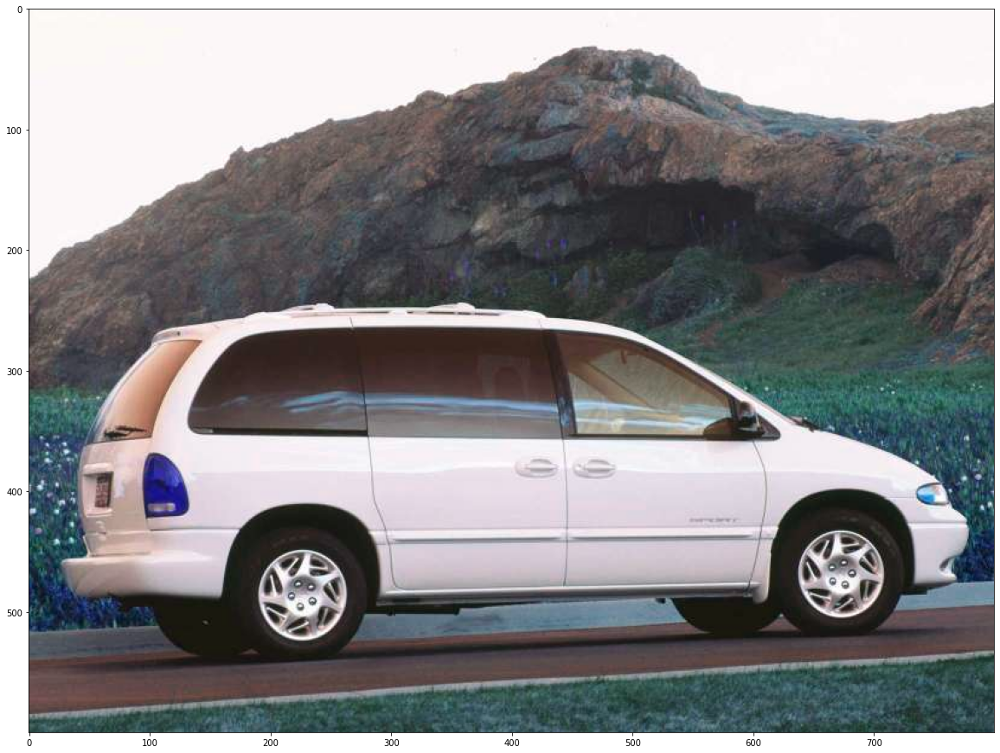

In [ ]:
plt.figure(figsize=[20.,20.])
plt.imshow(cv2.imread(images[2]))
print("Its label is: ",images[2].split('/')[-1].split('.')[0])

In [ ]:
datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2,
                             zoom_range=0.2, horizontal_flip= True, vertical_flip=True)

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
save_path = "/content/drive/MyDrive/AIML/GL Projects/CNN/augmented"

In [ ]:
def data_augmentation(img,pref):
  img = load_img(img)
  img = img_to_array(img)
  img = img.reshape((1,) + img.shape)

  j = 0
  for batch in datagen.flow(img, batch_size=1, seed=108, save_to_dir=save_path, save_format='jpg',save_prefix=pref):
    j +=1
    if j > 30:
      break

In [ ]:
for i in images:
  pf = i.split('/')[-1].split('.')[0]
  data_augmentation(i,pf)

In [ ]:
# Let's see how many images created
aug_images = glob.glob(save_path+'/*jpg')
len(aug_images)

465

From just 15 images, we have been successful in creating a dataset of 465 images, containing 31 images from each original image. I have limited them to 31 images for convenience but we can create as many images as possible. 

Let's see a few augmented images

Its label is:  00011_0_1440


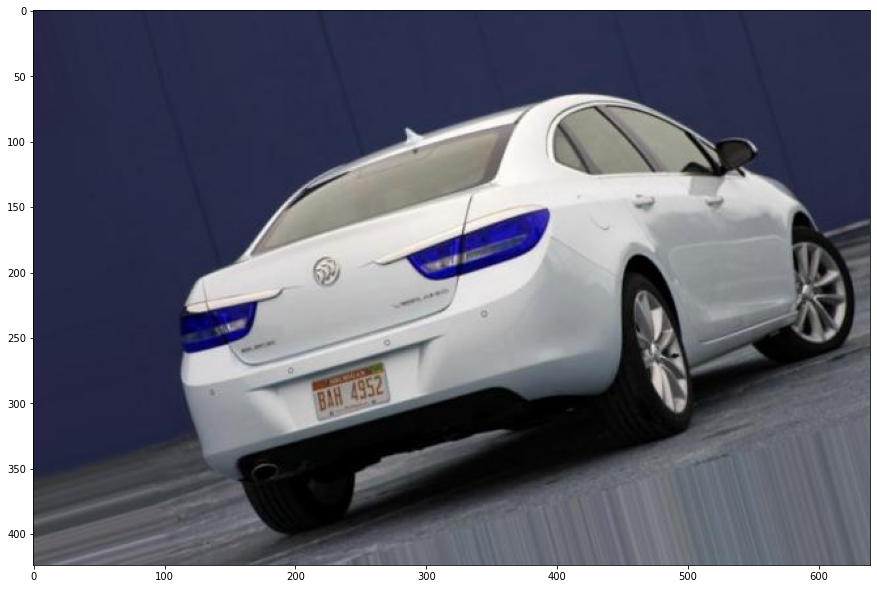

In [ ]:
plt.figure(figsize=[15.,15.])
aug1 = cv2.imread(aug_images[2])
plt.imshow(aug1)
print("Its label is: ",aug_images[2].split('/')[-1].split('.')[0])

Its label is:  00008_0_3171


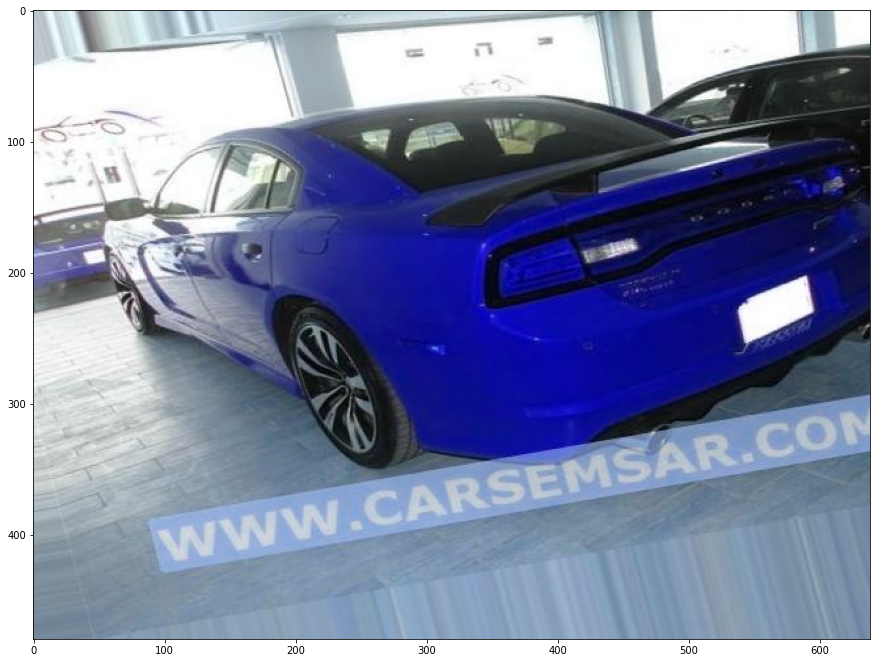

In [ ]:
plt.figure(figsize=[15.,15.])
aug1 = cv2.imread(aug_images[100])
plt.imshow(aug1)
print("Its label is: ",aug_images[100].split('/')[-1].split('.')[0])

Its label is:  00003_0_2821


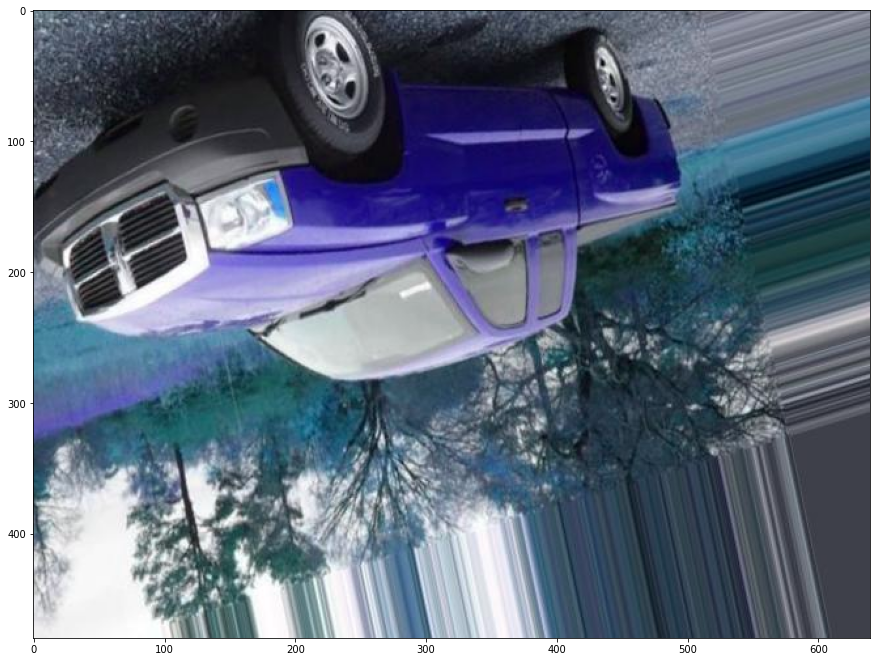

In [ ]:
plt.figure(figsize=[15.,15.])
aug1 = cv2.imread(aug_images[315])
plt.imshow(aug1)
print("Its label is: ",aug_images[315].split('/')[-1].split('.')[0])

Challenges that were faced during the image dataset preparation of this car data are as follows:

* There are quite less images, only 15 of them.
* No labels are provided for the images. So, we have to rely on the names of the images for their labels. 
* Due to non-availability of the labels, it was difficult to conclude whether all the images belong to the same instance/brand or belong to different brands.
* So, due to this problem, I treated each image to be of different brand and used their original image names as a prefix in the data augmentation technique to distinguish the augmented images of a particular brand/class. 
* Augmented images have been stored in one particular folder, but if we have to create a big dataset from this much number of images, we will have to store them in separate folders, which we will have to create manually to store the augmented images in them. 
* Since, we have one image for each class and we have augmented all the other images from one image per class, it would be biased towards that particular image only, no matter how much augmentation we do. For a dataset to be of any use in the real world, we need huge amount of data for our network to learn effectively. 

## **Part - 4**

## **Importing necessary libraries**

In [ ]:
import numpy as np

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC
from sklearn.metrics import plot_confusion_matrix, classification_report

import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import DirectoryIterator, ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Dropout, Input, BatchNormalization, Flatten, InputLayer
from tensorflow.keras import optimizers, initializers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.applications import mobilenet, resnet, vgg16, inception_v3
from tensorflow.keras.layers import Reshape
from tensorflow.keras.applications import VGG16, InceptionV3, ResNet50
from tensorflow.keras.applications.vgg16 import preprocess_input as vggpreprocess
from tensorflow.keras.applications.inception_v3 import preprocess_input as inceptionpreprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnetpreprocess
from tensorflow.keras import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model

## **Importing the data from Google Drive into python.**

In [ ]:
data = ImageDataGenerator(rescale=1./255, horizontal_flip=True, validation_split=0.2, shear_range=0.2,
                           zoom_range=0.2, rotation_range=90, vertical_flip=True)

In [ ]:
dataset = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(64,64), seed=108)

Found 1375 images belonging to 17 classes.


We can also use Directory Iterator to import data from multiple folders

In [ ]:
tr = DirectoryIterator("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                       data,target_size = (64,64), seed=108, class_mode = 'categorical', batch_size=32)

Found 1375 images belonging to 17 classes.


In [ ]:
# Segregating the data into training and validation sets

training_set = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(64,64), seed=108, subset = 'training')

test_set = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(64,64), seed=108, subset = 'validation')

Found 1101 images belonging to 17 classes.
Found 274 images belonging to 17 classes.


In [ ]:
training_set.class_indices

{'0': 0,
 '1': 1,
 '10': 2,
 '11': 3,
 '12': 4,
 '13': 5,
 '14': 6,
 '15': 7,
 '16': 8,
 '2': 9,
 '3': 10,
 '4': 11,
 '5': 12,
 '6': 13,
 '7': 14,
 '8': 15,
 '9': 16}

Seems labels are a bit mismatched. Let's match them manually.

In [ ]:
tr.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}

training_set.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}

test_set.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}



## **Visualisation of the Images and Applying Different Filters**

Class Label is:  0


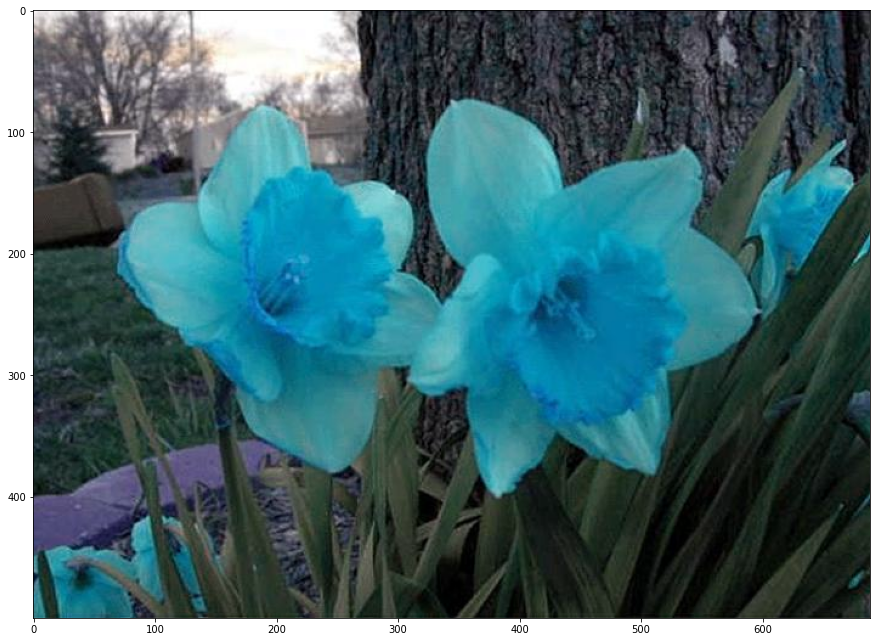

In [ ]:
plt.figure(figsize=[15.,15.])
plt.imshow(cv2.imread(tr.directory+'/'+tr.filenames[0]))
print("Class Label is: ", tr.classes[0])

Class Label is:  1


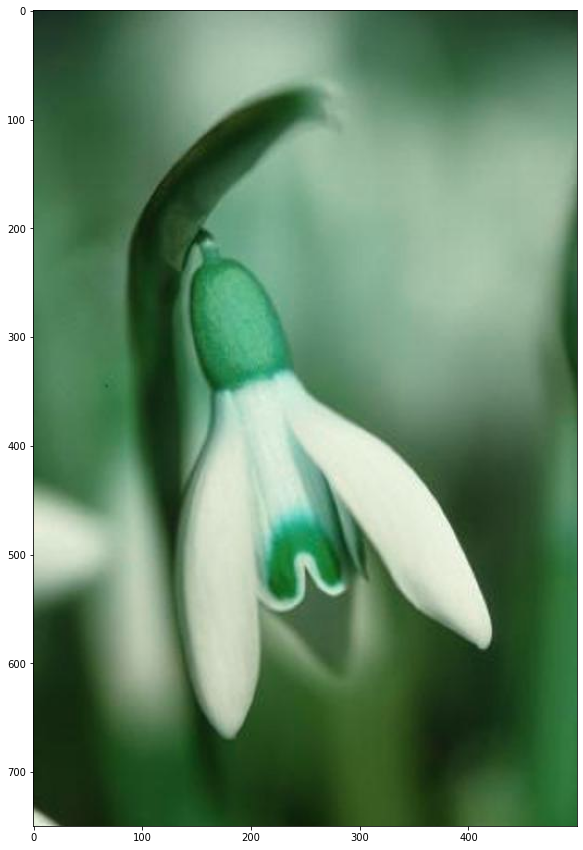

In [ ]:
plt.figure(figsize=[15.,15.])
plt.imshow(cv2.imread(tr.directory+'/'+tr.filenames[101]))
print("Class Label is: ", tr.classes[101])

Class Label is:  9


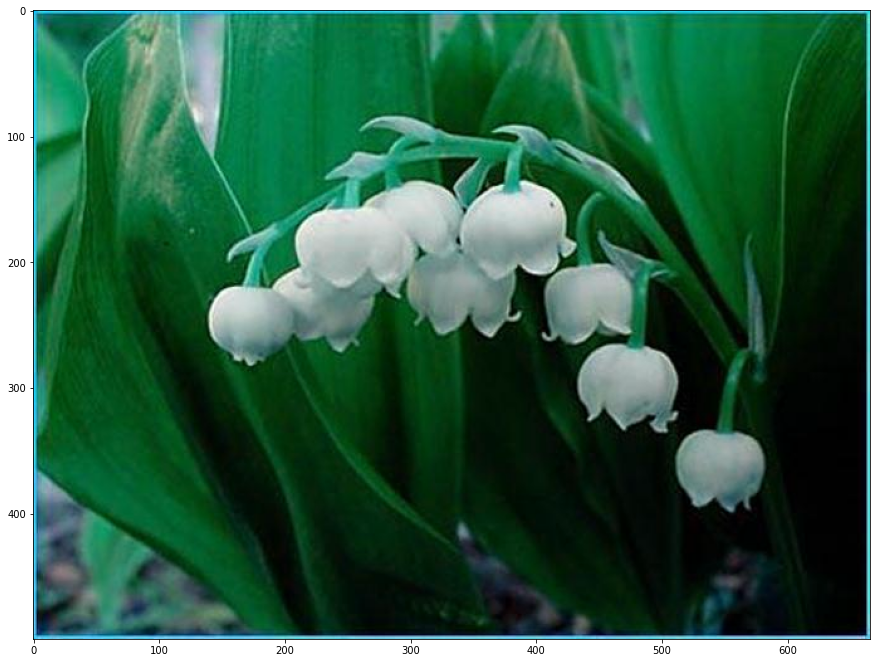

In [ ]:
plt.figure(figsize=[15.,15.])
plt.imshow(cv2.imread(tr.directory+'/'+tr.filenames[750]))
print("Class Label is: ", tr.classes[750])

### **Blur**

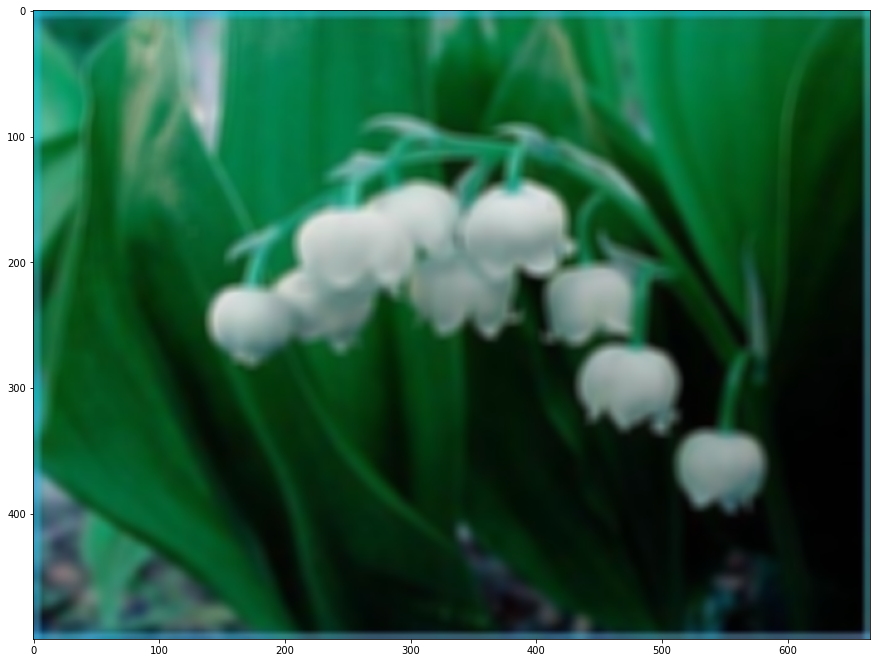

In [ ]:
plt.figure(figsize=[15.,15.])
plt.imshow(cv2.blur(cv2.imread(tr.directory+'/'+tr.filenames[750]),ksize=(10,10)))

### **Edge Detection**

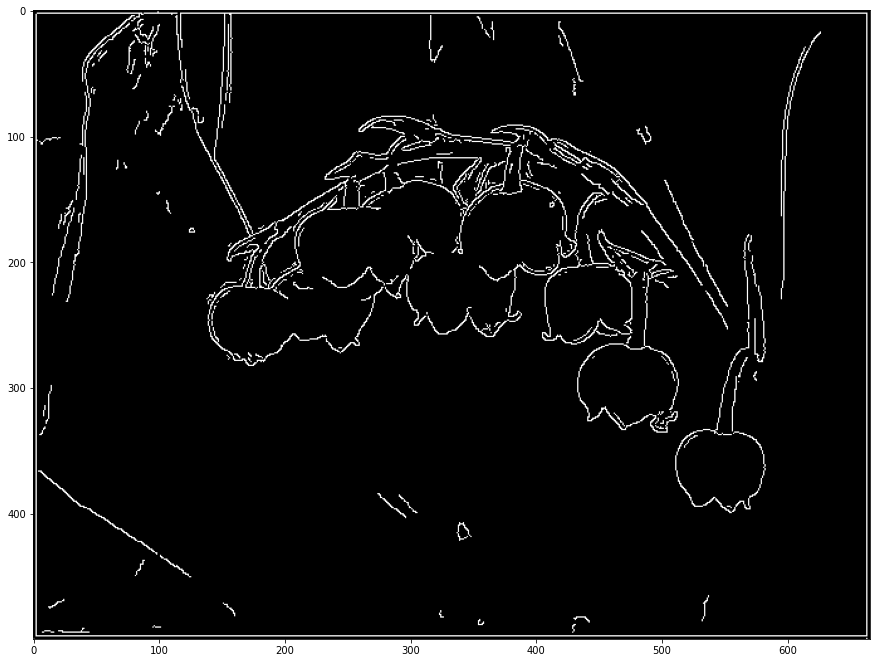

In [ ]:
plt.figure(figsize=[15.,15.])
edge = cv2.cvtColor(cv2.imread(tr.directory+'/'+tr.filenames[750]),cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.Canny(edge,100,150), cmap='gray')

In [ ]:
import numpy as np

### **Contours**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


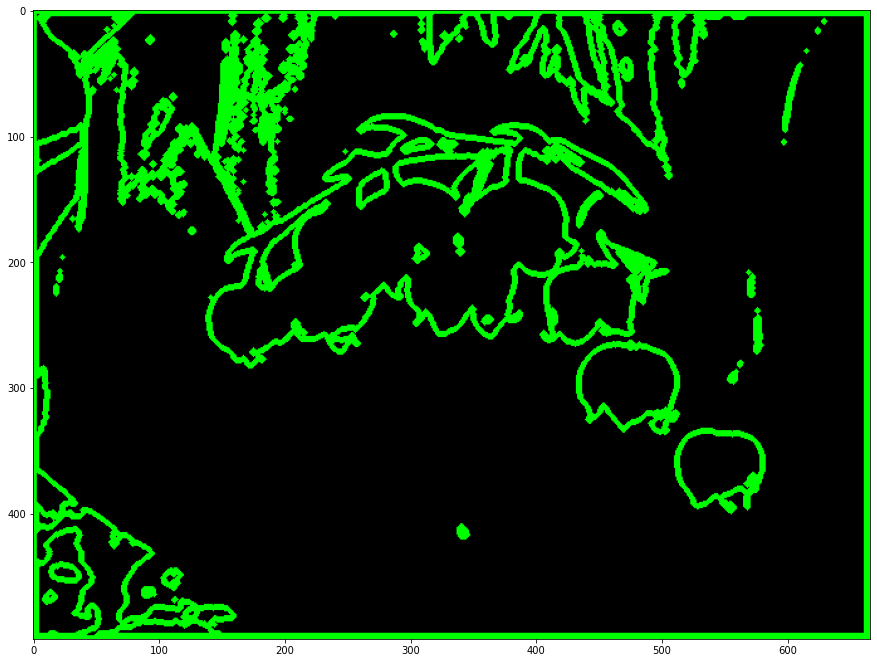

In [ ]:
ret,thresh_img = cv2.threshold(edge, 100, 255, cv2.THRESH_BINARY)
#find contours
contours, hierarchy = cv2.findContours(thresh_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
#creating an empty image for contours
img_contours = np.zeros(cv2.imread(tr.directory+'/'+tr.filenames[750]).shape)
# drawing the contours on the empty image
plt.figure(figsize=[15.,15.])
plt.imshow(cv2.drawContours(img_contours, contours, -1, (0,255,0), 3))

### **Embross**

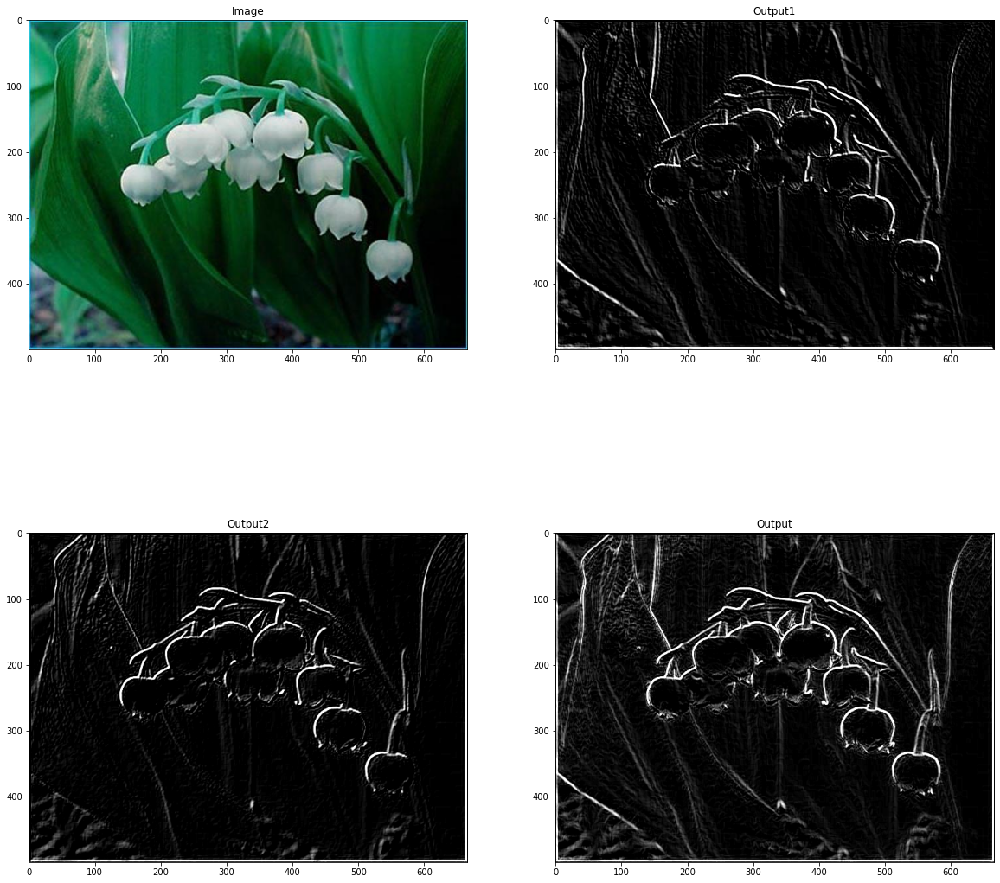

In [ ]:
img = cv2.imread(tr.directory+'/'+tr.filenames[750])
height, width = img.shape[:2]
y = np.ones((height, width), np.uint8) * 128
output = np.zeros((height, width), np.uint8)
# generating the kernels
kernel1 = np.array([[0, -1, -1], # kernel for embossing bottom left side
                    [1, 0, -1],
                    [1, 1, 0]])
kernel2 = np.array([[-1, -1, 0], # kernel for embossing bottom right side
                    [-1, 0, 1],
                    [0, 1, 1]])
# you can generate kernels for embossing top as well
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
output1 = cv2.add(cv2.filter2D(gray, -1, kernel1), y) # emboss on bottom left side
output2 = cv2.add(cv2.filter2D(gray, -1, kernel2), y) # emboss on bottom right side
for i in range(height):
    for j in range(width):
        output[i, j] = max(output1[i, j], output2[i, j]) # combining both embosses to produce stronger emboss
fig,ax = plt.subplots(2,2, figsize=[20.,20.])
# plt.figure(figsize=[20.,20.])
ax[0][0].imshow(img)
ax[0][0].title.set_text("Image")
ax[0][1].imshow(output1, cmap= 'gray')
ax[0][1].title.set_text("Output1")
ax[1][0].imshow(output2, cmap= 'gray')
ax[1][0].title.set_text("Output2")
ax[1][1].imshow(output, cmap= 'gray')
ax[1][1].title.set_text("Output")
# cv2_imshow(img)
# cv2_imshow(output1)
# cv2_imshow(output2)
# cv2_imshow(output)

### **Smoothening**

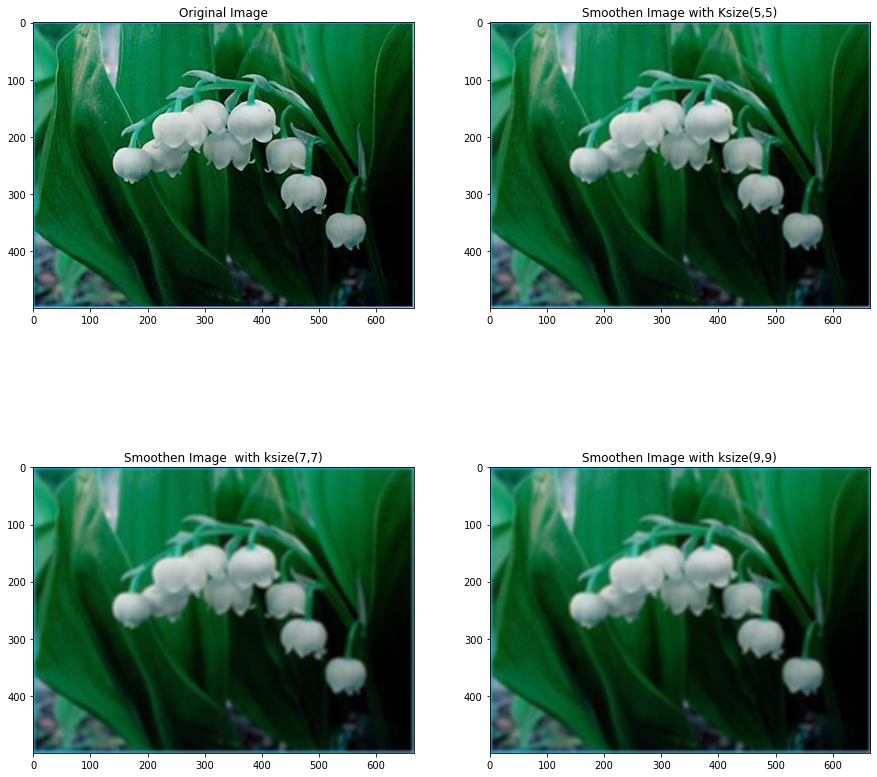

In [ ]:
smooth1 = cv2.GaussianBlur(img, (5,5),cv2.BORDER_DEFAULT)
smooth2 = cv2.GaussianBlur(img, (9,9),cv2.BORDER_DEFAULT)
smooth3 = cv2.GaussianBlur(img, (9,9),cv2.BORDER_DEFAULT)
fig, ax = plt.subplots(2,2, figsize = [15.,15.])
ax[0][0].imshow(img)
ax[0][0].title.set_text("Original Image")
ax[0][1].imshow(smooth1)
ax[0][1].title.set_text("Smoothen Image with Ksize(5,5)")
ax[1][0].imshow(smooth2)
ax[1][0].title.set_text("Smoothen Image  with ksize(7,7)")
ax[1][1].imshow(smooth3)
ax[1][1].title.set_text("Smoothen Image with ksize(9,9)")

## **Model Building**

### **Supervised Learning Method**

In [ ]:
# Let's first convert the images and the labels in the form acceptable by the 
# machine learning models
images = []
labels = []

for i in range(len(tr.classes)):
  image = cv2.imread(tr.directory + '/' + tr.filenames[i])
  image = cv2.resize(image, (64,64))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = image.flatten()
  label = tr.classes[i]
  image = image * (1./255)

  images.append(image)
  labels.append(label)

In [ ]:
len(images), len(labels)

(1375, 1375)

In [ ]:
# Segregating training and testing data
X_train, X_test, y_train, y_test = train_test_split(np.array(images), np.array(labels), test_size=0.2, random_state=108)

In [ ]:
len(X_train), len(X_test), len(y_train), len(y_test)

(1100, 275, 1100, 275)

In [ ]:
rf_model = RandomForestClassifier(max_depth=12, random_state=108)
rf_model.fit(np.array(X_train), np.array(y_train))

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=12, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=108,
                       verbose=0, warm_start=False)

I had tried several models but Random FOrest model was performing the best among those. Hence, kept this one for the reference for all the supervised learning models.

In [ ]:
preds = rf_model.predict(X_test)

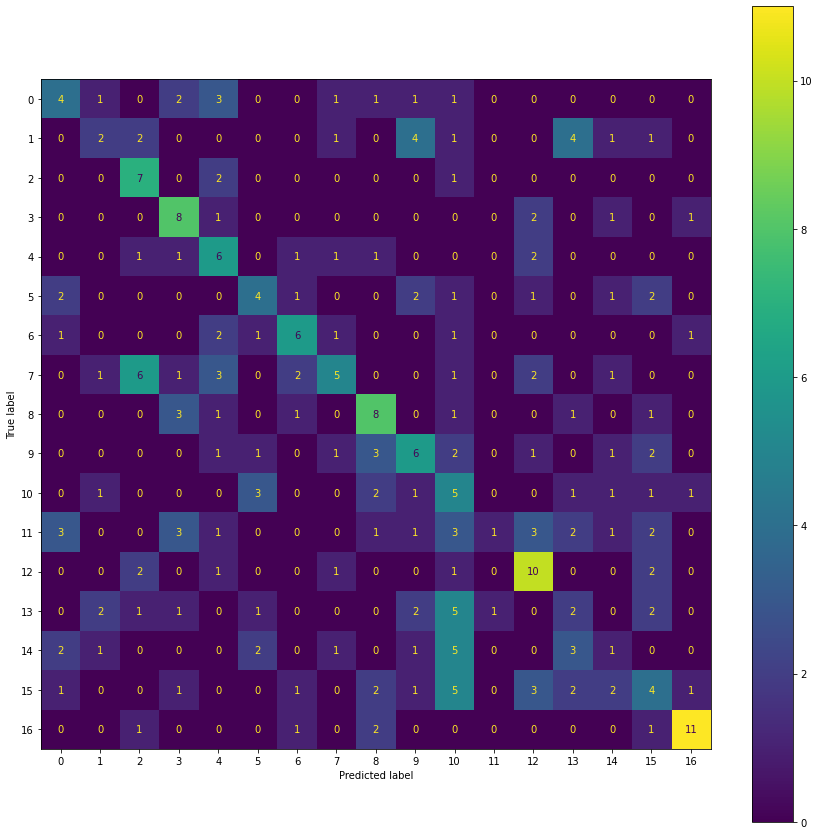

In [ ]:
fig, ax= plt.subplots(figsize=[15.,15.])
plot_confusion_matrix(rf_model, X_test, y_test, ax=ax)

As we can see that there are a lot of misclassifications in almost all the classes. Let us have a look at classification report to be better able to comprehend the above confusion matrix.

In [ ]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.31      0.29      0.30        14
           1       0.25      0.12      0.17        16
           2       0.35      0.70      0.47        10
           3       0.40      0.62      0.48        13
           4       0.29      0.46      0.35        13
           5       0.33      0.29      0.31        14
           6       0.46      0.46      0.46        13
           7       0.42      0.23      0.29        22
           8       0.40      0.50      0.44        16
           9       0.32      0.33      0.32        18
          10       0.15      0.31      0.20        16
          11       0.50      0.05      0.09        21
          12       0.42      0.59      0.49        17
          13       0.13      0.12      0.12        17
          14       0.10      0.06      0.08        16
          15       0.22      0.17      0.20        23
          16       0.73      0.69      0.71        16

    accuracy              

This report is evident that supervised learning models don't work well on image dataset. The f1-score is quite low for all the classes and overall accuracy is also dismal. 

### **Artificial Neural Network Method**

In [ ]:
# Defining the architecture of the ANN
model = Sequential()
model.add(Flatten())
model.add(InputLayer(input_shape=(64*64*3,)))
# model.add(BatchNormalization())
# model.add(Activation('relu'))
# model.add(Dropout(0.2))
model.add(Dense(750))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(500))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(350))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(17,activation='softmax'))

In [ ]:
# Declaring the optimizer and compiling the model
opt = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
early = EarlyStopping(patience=5) # For early stopping if the validation loss doesn't decrease for 5 epochs

In [ ]:
model.fit(training_set, validation_data=test_set, batch_size=32, epochs=75)#callbacks=early)

Epoch 1/75
35/35 [==============================] - 467s 13s/step - loss: 2.9627 - accuracy: 0.1689 - val_loss: 75.2827 - val_accuracy: 0.0949
Epoch 2/75
35/35 [==============================] - 9s 258ms/step - loss: 2.3584 - accuracy: 0.2461 - val_loss: 16.3873 - val_accuracy: 0.1460
Epoch 3/75
35/35 [==============================] - 9s 267ms/step - loss: 2.2134 - accuracy: 0.2770 - val_loss: 6.2372 - val_accuracy: 0.1861
Epoch 4/75
35/35 [==============================] - 9s 266ms/step - loss: 2.0653 - accuracy: 0.2916 - val_loss: 3.0175 - val_accuracy: 0.2956
Epoch 5/75
35/35 [==============================] - 9s 255ms/step - loss: 1.8844 - accuracy: 0.3370 - val_loss: 3.0203 - val_accuracy: 0.2883
Epoch 6/75
35/35 [==============================] - 9s 250ms/step - loss: 1.8053 - accuracy: 0.3460 - val_loss: 2.5449 - val_accuracy: 0.3358
Epoch 7/75
35/35 [==============================] - 9s 248ms/step - loss: 1.7770 - accuracy: 0.3733 - val_loss: 2.0325 - val_accuracy: 0.3321
Epoc

Again, we can see that an ANN is performing quite poorly on an image dataset and image classification task. Mainly because feed forward networks don't perform well on image classification as they don't have local spatial coherence.

## **Convolution Neural Network Method**

In [ ]:
# Initialising the CNN classifier
classifier = Sequential()

# Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), input_shape = (64, 64, 3), activation = 'relu', padding = 'same'))

# Add a Max Pooling layer of size 2X2
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Flattening the layer before fully connected layers
classifier.add(Flatten())

# Adding a fully connected layer with 512 neurons
classifier.add(Dense(units = 512, activation = 'relu'))

# Adding dropout with probability 0.5
classifier.add(Dropout(0.2))


# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 256, activation = 'relu'))


# The final output layer with 5 neuron to predict the categorical classifcation
classifier.add(Dense(units = 17, activation = 'softmax'))

In [ ]:
# Let's see the summary of the model parameters
classifier.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 64, 64, 32)        896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)             

In [ ]:
# Defining the optimizer and compiling the model
opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
classifier.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
classifier.fit(training_set, validation_data=test_set,batch_size=32,epochs = 75)#, callbacks=early)

Epoch 1/75
35/35 [==============================] - 10s 277ms/step - loss: 2.6093 - accuracy: 0.1299 - val_loss: 2.2370 - val_accuracy: 0.2518
Epoch 2/75
35/35 [==============================] - 10s 280ms/step - loss: 2.2091 - accuracy: 0.2361 - val_loss: 2.0014 - val_accuracy: 0.3102
Epoch 3/75
35/35 [==============================] - 10s 277ms/step - loss: 1.9382 - accuracy: 0.3224 - val_loss: 1.6446 - val_accuracy: 0.3942
Epoch 4/75
35/35 [==============================] - 9s 269ms/step - loss: 1.7272 - accuracy: 0.3960 - val_loss: 1.4638 - val_accuracy: 0.4635
Epoch 5/75
35/35 [==============================] - 9s 252ms/step - loss: 1.5745 - accuracy: 0.4469 - val_loss: 1.5232 - val_accuracy: 0.4891
Epoch 6/75
35/35 [==============================] - 9s 257ms/step - loss: 1.5128 - accuracy: 0.4787 - val_loss: 1.4863 - val_accuracy: 0.4891
Epoch 7/75
35/35 [==============================] - 9s 253ms/step - loss: 1.3719 - accuracy: 0.5304 - val_loss: 1.3001 - val_accuracy: 0.5073
Epo

Clearly, CNN is outperforming supervised and ANN models. CNN models perform extraordinarily on the image data, since they preserve the spatial information and due to that are able to extract the features from the images in a better way.

In [ ]:
vgg = VGG16(include_top=False, input_shape=(224,224,3), classes=17)

In [ ]:
for layer in vgg.layers:
  layer.trainable = False

In [ ]:
data = ImageDataGenerator(preprocessing_function=vggpreprocess, validation_split=0.2)
vgg_training = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(224,224), 
                              seed=108, subset = 'training')
vgg_test = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(224,224), 
                              seed=108, subset = 'validation')
vgg_training.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}
 
vgg_test.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}

Found 1101 images belonging to 17 classes.
Found 274 images belonging to 17 classes.


In [ ]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 16, 16, 128)       0     

In [ ]:
# vgg.trainable = False
# inputs = InputLayer(input_shape=(1,64,64,3))
x = Flatten()(vgg.output)
output = Dense(17,activation='softmax')(x)
vgg_model = Model(inputs=vgg.input, outputs=output)

In [ ]:
vgg_model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [ ]:
vgg_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
vgg_fit = vgg_model.fit_generator(vgg_training, validation_data=vgg_test, epochs=10,steps_per_epoch=len(vgg_training), validation_steps=len(vgg_test))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
35/35 [==============================] - 11s 313ms/step - loss: 7.5388 - accuracy: 0.6376 - val_loss: 1.6051 - val_accuracy: 0.9088
Epoch 2/10
35/35 [==============================] - 11s 307ms/step - loss: 0.3169 - accuracy: 0.9718 - val_loss: 2.8236 - val_accuracy: 0.8869
Epoch 3/10
35/35 [==============================] - 11s 303ms/step - loss: 0.1472 - accuracy: 0.9900 - val_loss: 2.5594 - val_accuracy: 0.9051
Epoch 4/10
35/35 [==============================] - 11s 312ms/step - loss: 0.0092 - accuracy: 0.9991 - val_loss: 2.1729 - val_accuracy: 0.9051
Epoch 5/10
35/35 [==============================] - 11s 325ms/step - loss: 6.9541e-06 - accuracy: 1.0000 - val_loss: 2.1634 - val_accuracy: 0.9051
Epoch 6/10
35/35 [==============================] - 11s 321ms/step - loss: 1.6562e-06 - accuracy: 1.0000 - val_loss: 2.1610 - val_accuracy: 0.9051
Epoch 7/10
35/35 [==============================] - 11s 313ms/step - loss: 1.4677e-06 - accuracy: 1.0000 - val_loss: 2.1599 - val_accu

Earlier, because of the limited computation capabilities, I have used the (64,64,3) size input images, due to which the validation accuracy wasn't not coming up to the marks. But here, since I have used (224,224,3) size images, the validation accuracy has improved a lot. Here, since I only had to do transfer learning, I was able to use higher resolution of the images, which doesn't use much computation power.

**Similarly, if we use higher resolution images in previously built networks as well, we would be able to get a much higher accuracy, both training and validation one.**

In [ ]:
data = ImageDataGenerator(preprocessing_function=resnetpreprocess, validation_split=0.2)
rn_training = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(224,224), 
                              seed=108, subset = 'training')
rn_test = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(224,224), 
                              seed=108, subset = 'validation')

rn_training.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}
 
rn_test.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}

Found 1101 images belonging to 17 classes.
Found 274 images belonging to 17 classes.


In [ ]:
resnet = ResNet50(include_top=False, input_shape=(224,224,3), classes=17)

for layer in resnet.layers:
  layer.trainable = False

94773248/94765736 [==============================] - 3s 0us/step


In [ ]:
x = Flatten()(resnet.output)
output = Dense(17,activation='softmax')(x)
rn_model = Model(inputs=resnet.input, outputs=output)

In [ ]:
rn_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [ ]:
rn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
rn_fit = rn_model.fit_generator(rn_training, validation_data=rn_test, epochs=10,steps_per_epoch=len(rn_training), validation_steps=len(rn_test))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
35/35 [==============================] - 684s 19s/step - loss: 3.8538 - accuracy: 0.7148 - val_loss: 3.1932 - val_accuracy: 0.8175
Epoch 2/10
35/35 [==============================] - 14s 399ms/step - loss: 0.3225 - accuracy: 0.9664 - val_loss: 2.0865 - val_accuracy: 0.8869
Epoch 3/10
35/35 [==============================] - 14s 406ms/step - loss: 0.1400 - accuracy: 0.9864 - val_loss: 1.3058 - val_accuracy: 0.9088
Epoch 4/10
35/35 [==============================] - 14s 401ms/step - loss: 0.0928 - accuracy: 0.9900 - val_loss: 3.1251 - val_accuracy: 0.8321
Epoch 5/10
35/35 [==============================] - 14s 402ms/step - loss: 0.0865 - accuracy: 0.9946 - val_loss: 2.1505 - val_accuracy: 0.8613
Epoch 6/10
35/35 [==============================] - 14s 404ms/step - loss: 0.0354 - accuracy: 0.9955 - val_loss: 1.9458 - val_accuracy: 0.8650
Epoch 7/10
35/35 [==============================] - 14s 401ms/step - loss: 0.0169 - accuracy: 0.9973 - val_loss: 2.2735 - val_accuracy: 0.8650


Similarly, Resnet network is working very well on our image dataset and giving a very high accuracy, both training as well as validation one.

In [ ]:
incep = InceptionV3(include_top=False, input_shape=(224,224,3), classes=17)

for layer in incep.layers:
  layer.trainable = False

In [ ]:
data = ImageDataGenerator(preprocessing_function=inceptionpreprocess, validation_split=0.2)
incep_training = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(224,224), 
                              seed=108, subset = 'training')
incep_test = data.flow_from_directory("/content/drive/MyDrive/AIML/GL Projects/CNN/Flowers - Classification/17flowers- train/jpg",
                              target_size=(224,224), 
                              seed=108, subset = 'validation')

incep_training.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}
incep_test.class_indices = {'0': 0,
 '1': 1,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '15': 15,
 '16': 16,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9}

Found 1101 images belonging to 17 classes.
Found 274 images belonging to 17 classes.


In [ ]:
x = Flatten()(incep.output)
output = Dense(17,activation='softmax')(x)
incep_model = Model(inputs=incep.input, outputs=output)

In [ ]:
incep_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
incep_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           batch_normalization[0][0]        
____________________________________________________________________________________________

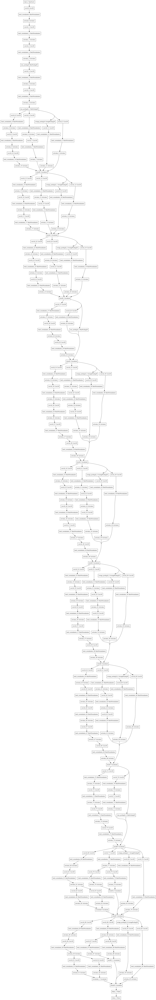

In [ ]:
plot_model(incep_model)#, show_shapes=True, expand_nested=True)

In [ ]:
incep_fit = incep_model.fit_generator(incep_training, validation_data=incep_test, epochs=10,steps_per_epoch=len(incep_training), validation_steps=len(incep_test))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
35/35 [==============================] - 18s 399ms/step - loss: 7.5802 - accuracy: 0.5077 - val_loss: 2.9273 - val_accuracy: 0.6898
Epoch 2/10
35/35 [==============================] - 12s 353ms/step - loss: 0.5306 - accuracy: 0.9128 - val_loss: 1.3341 - val_accuracy: 0.8358
Epoch 3/10
35/35 [==============================] - 13s 358ms/step - loss: 0.1917 - accuracy: 0.9637 - val_loss: 1.6263 - val_accuracy: 0.8285
Epoch 4/10
35/35 [==============================] - 13s 356ms/step - loss: 0.0943 - accuracy: 0.9827 - val_loss: 1.1617 - val_accuracy: 0.8577
Epoch 5/10
35/35 [==============================] - 12s 356ms/step - loss: 0.0400 - accuracy: 0.9909 - val_loss: 1.7122 - val_accuracy: 0.8175
Epoch 6/10
35/35 [==============================] - 12s 353ms/step - loss: 0.0273 - accuracy: 0.9946 - val_loss: 0.9766 - val_accuracy: 0.8723
Epoch 7/10
35/35 [==============================] - 12s 353ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.2035 - val_accuracy: 0.8577

And just like VGG and Resnet, Inception model is working exceptionally well on our image dataset. 

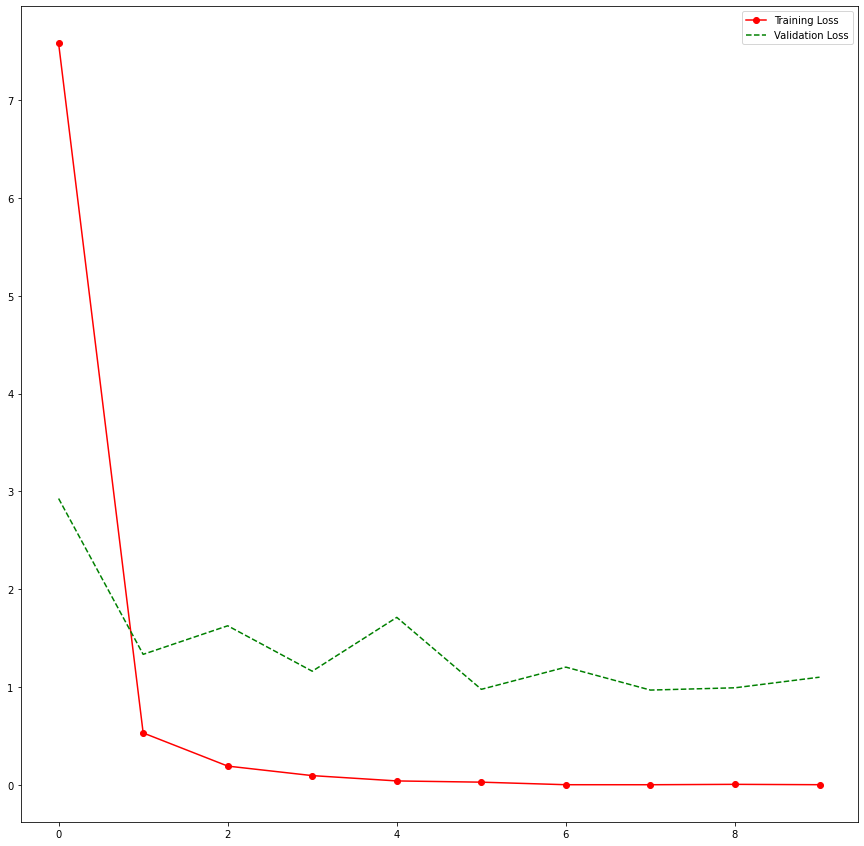

In [ ]:
plt.figure(figsize=[15.,15.])
plt.plot(incep_fit.epoch,incep_fit.history['loss'],'r-o', label='Training Loss')
plt.plot(incep_fit.epoch,incep_fit.history['val_loss'],'g--', label='Validation Loss')
plt.legend()
plt.show()

Training and validation loss shows that training loss although almost saturated but still kept decreasing on every epoch, whereas, validation loss saturated early and kept swinging around some value. Still, both are low. There are a few signs of overfitting and we would need to hypertune it to generalize it to the entire population.

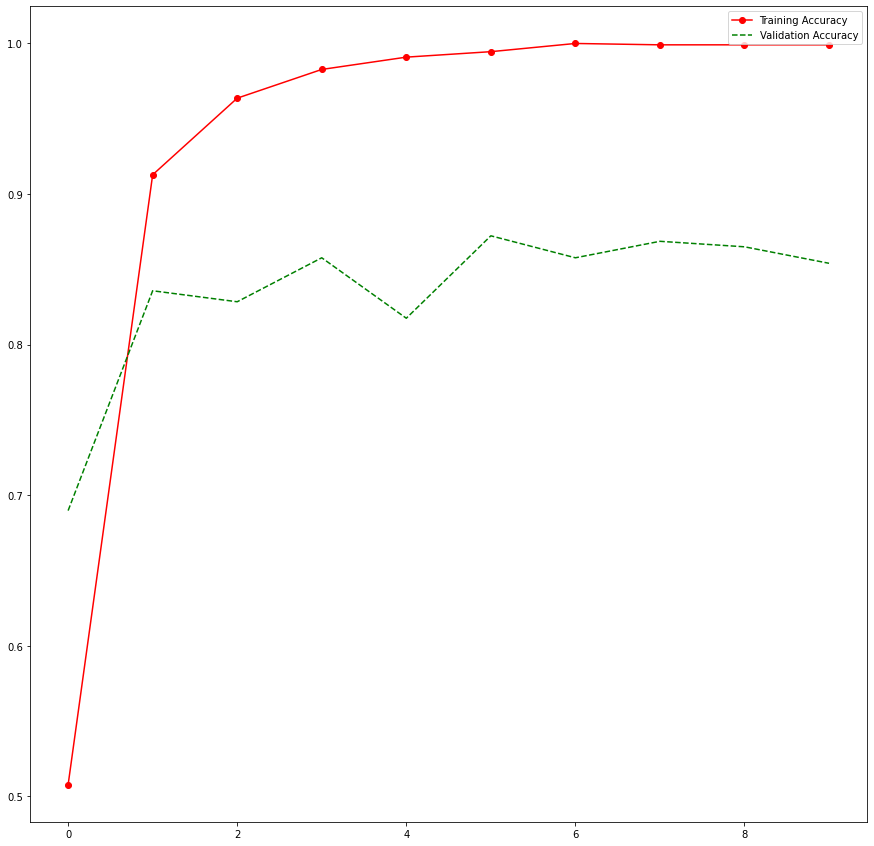

In [ ]:
plt.figure(figsize=[15.,15.])
plt.plot(incep_fit.epoch,incep_fit.history['accuracy'],'r-o', label='Training Accuracy')
plt.plot(incep_fit.epoch,incep_fit.history['val_accuracy'],'g--', label='Validation Accuracy')
plt.legend()
plt.show()

Same is the case with training accuracy and validation accuracy. Validation data has slightly lower accuracy than the training accuracy. Again, we need to hypertune the network to generalize the model.

## **GUI**

In [ ]:
from tkinter import *

In [ ]:
root = Tk()
root.title("Convolutional Neural Network Project")
root.geometry("800x600")

loaded_model = load_model(r"C:\Users\AK\Downloads\Saved models-20210811T123730Z-001\Saved models\cls.h5")

def import_file(tb):
    global pred_image
    try:
        pred_image = cv2.imread(r"C:\Users\AK\Downloads\Test-20210811T131321Z-001\Test"+"\\"+tb.get())
        pred_image = cv2.resize(pred_image,(64,64))
        pred_image = np.expand_dims(pred_image,axis=0)
        pred_image = pred_image *(1./255)
        confirm_imp = Entry(root, width=20, bd=3)
        confirm_imp.grid(row=0,column=9,columnspan=2)
        confirm_imp.insert(0,"Import Successful")
    except:
        confirm_imp = Entry(root, width=20, bd=3)
        confirm_imp.grid(row=0,column=9,columnspan=2)
        confirm_imp.insert(0,"Not Imported")
        
    
def predictions():
    preds = loaded_model.predict(pred_image)
    predicted = np.argmax(preds)
    pred_entry = Entry(root, width=20, bd=3)
    pred_entry.grid(row=3,column=2)
    pred_entry.insert(0,predicted)
    
image_name = Label(root, text="Step 1: File Name",padx=5,pady=6,font = ('calibri', 10, 'bold'))#,bg='light blue')
image_name.grid(row=0, column=0, columnspan=2)

tb = Entry(root,width=20, bd=3)
tb.grid(row=0, column=3, columnspan=2)

import_btn = Button(root,text='Import Data',command=lambda :import_file(tb),padx=7,
                pady=3,font = ('calibri', 10, 'bold'),
                bg=None,fg="#6C3483",activebackground="#A569BD",borderwidth=2,anchor='center')
import_btn.grid(row=0,column=6,columnspan=2)

pred_name = Label(root, text="Image Classifier",padx=5,pady=6,font = ('calibri', 10, 'bold'))#,bg='light blue')
pred_name.grid(row=1, column=0, columnspan=2)

pred_btn = Button(root,text='Predict',command=predictions,padx=7,
                pady=3,font = ('calibri', 10, 'bold'),
                bg=None,fg="#6C3483",activebackground="#A569BD",borderwidth=2,anchor='center')
pred_btn.grid(row=1,column=2,columnspan=2)

root.mainloop()

## **Part-5**

**Explain in depth your strategy to maintain and support the AIML image classifier after it in production**

Before discussing the strategies to maintain and support the AIML image classifier after it is in production, let's see what steps we can take to ensure the effectiveness of the model before its deployment.

Before deploying the model, we must do two things:
* First, if possible add a low percentage of negative test data as part of model results. Negative testing is a method of testing an application that ensures that the model handles the unwanted input the way it should be. A good model will have high accuracy for positive data at the same time it should give a low score for negative ingested data. The high success rate from a negative dataset is a good indication that the current model's training data should be re-evaluated. When we get good accuracy on the negative data or low accuracy on the data, (expect the negative sample) will be an indication that the model has some problems.

* Second, I would recommend developing an autoencoder (AE) model with training data on our deployed model. Using anomaly detection techniques, pass the recent model input data to get the reconstruction error value. A high reconstruction error will indicate that the input deviates from the original training data.

Based on accuracy scores of Positive data and negative data, and the reconstruction error value, we can take certain actions like,

**Actions 1:  Retrain the model with new data**<br>
When the model produced high accuracy score and negative test accuracy is also significantly high, get the reconstruction error value from the AE model with recent data. If the reconstruction error value is low the data is not changed much. The next best action will be retraining the model with recent data.

**Actions 2:  Retrain the model with additional features** <br>
When the model produced a low accuracy score on both positive and negative dataset accuracy is significantly high.  , the reconstruction error value is low that indicates that data is not changed much but we need to tune the model with new features. In this case, you already have the data you need, but retraining the same model on the same data is not going to help. The action would be develop new features by doing the feature-engineering step and retrain the model with additional features. Remember to preserve the features from the original model.

**Actions 3:  Develop a new model from scratch** <br>
When the model produced a low accuracy score on recent positive data and negative test accuracy is significantly high. Furthermore, the reconstruction error value is also high for recent input data is a clear indication that the new recent input data is much different and has new features than the model originally trained.  The next nest action would be repeating the process of feature extraction, then build, and train a new model from scratch.

Now, let's discuss, why do we need to maintain the model after deployment?

**In-Domain but Unseen Data**<br>
A typical machine learning model is trained on about 10% of the possible universe of data. This is either because of the scarcity of appropriately labeled data or because of the computational constraints of training on massive amounts of data.<br>
The choice of the machine learning model and the training strategies should provide generalizability on the remaining 90% of the data. But there will still be data samples within this pool where the model output is incorrect or less-than-optimal.

**The Changing Nature of Input Data**<br>
In all real-world deployments of machine learning solutions, there will be a subset of the input data which comes from a system that the data science team has little control over. When those systems change the input, the data science teams are not always kept in the loop (happens largely due to the inherent complexities in the data world).<br>
Simple changes in the input data, like a type change from ‘scalar’ to ‘list’, can be relatively easily detected through basic sanity checks. But there are a variety of changes which are difficult to catch, have a substantially detrimental impact on the output of the machine learning system and unfortunately are not uncommon.<br>
As the systems get complex, it is almost impossible to anticipate all such likely changes beforehand to encode exhaustive exception handling.

**Changes in Data Interpretation**<br>
The landscape of just about every business is changing quite rapidly. Words which didn’t exist a few years ago (and would hence be just marked as ‘out-of-vocabulary’), have now become keywords with significant interpretations.<br>
As new business models emerge, existing businesses venture into adjacent spaces, mergers, and acquisitions happen, and the human interpretation of a particular activity may change over time. This dynamic nature of data and its interpretation has serious implications for our machine learning model.

**Machine Learning Systems Deployed in Unexpected Contexts**<br>
One human capability that is vastly superior to today’s machines is to weave in seemingly disparate sources of information to form a complete context to interpret a data point.<br>
As machine learning systems become more and more mainstream, they will be expected to mimic the context-aware human behavior.

These above are some of the problems after deployment for which we need to keep track of the performance of our machine learning models for them to be effective in a long run. 

Following are the two ways we monitor the models after deployment:

**Proactive Model Monitoring**<br>
If we cannot auto-heal, what can be done then? The next best thing to do is to continuously track the health of the machine learning model against a set of key indicators and generate specific event-based alerts.<br>
The key element of the monitoring framework is to identify which input samples deviate significantly from the patterns seen in the training data and then have those samples closely examined by a human expert.

**Reactive Model Monitoring**<br>
After the successful deployment of a machine learning-driven solution, the data science team will almost always feel like they have earned bragging rights like “our system has state-of-the-art 99% accuracy!”.<br>
But instinctively (and rightfully so), the first thing that the customer-facing teams will ask is “what is the plan to address customer escalations on the 1%?”.<br>
This calls for reactive model monitoring which performs root-cause-analysis (RCA) of the customer escalations and provides an estimate of when the bugs will be fixed.

Reactive model monitoring is quite similar to that of proactive model monitoring. But there are subtle differences in terms of the end goals.

Whereas proactive model maintenance identified general patterns in the test data which are outliers compared to those in the training data, the goal of Reactive Model Maintenance is to identify what led to an erroneous output in a specific test sample and how it can be rectified.

After proactive and reactive model monitoring, we must do:

**Address the Root Cause, Not the Symptoms**<br>
Given these wide varieties of sources that may lead to a drop in performance of the ML-systems over time and the intense pressure to fix the issues within a given SLA, it can be tempting to have a ‘thin-layer-of-rules’ which bypasses the ML machinery completely to address the immediate customer escalation.<br>
Such a thin-layer or hot-fix approach is actually a ‘lazy-fix’ which has the potential to turn disastrous in the long run. Thus, such a thin-layer of rules should be touched only under extreme conditions and should not be allowed to get beyond a certain ‘thickness’.<br>
When the pre-defined ‘thickness’ is reached, our machine learning model has to be retrained to address the issues encoded in the thin-layer.

Sources:
<https://www.datasciencecentral.com/profiles/blogs/how-to-maintain-model-effectiveness-after-deployed><br>
<https://www.analyticsvidhya.com/blog/2019/10/deployed-machine-learning-model-post-production-monitoring/>